# Predicting Ingredients

**Name(s)**: Pratham Mittal and ...

In [44]:
import pandas as pd
import numpy as np
from pathlib import Path
import ast

import plotly.express as px
pd.options.plotting.backend = 'plotly'

import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
# import klib
import statsmodels.formula.api as smf
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
import matplotlib.pyplot as plt
import sklearn.metrics as metrics

## Step 1: Introduction

The recipes dataset for prediciting ingredients

## Step 2: Data Cleaning and Exploratory Data Analysis

In [45]:
food_path = Path('data')
interactions = pd.read_csv(food_path / 'RAW_interactions.csv')
recipes = pd.read_csv(food_path / 'RAW_recipes.csv')
merged_df = pd.merge(recipes, interactions, left_on='id', right_on = 'recipe_id', how='left')
merged_df['rating'] = merged_df['rating'].replace(0, np.nan)
mean_avg = merged_df.groupby('id')['rating'].mean()
merged_df['avg_rating'] = merged_df['id'].map(mean_avg)

In [46]:
def func(inp):
    return ast.literal_eval(inp)

In [47]:
merged_df_copy = merged_df.copy()
merged_df_copy['nutrition'] = merged_df_copy['nutrition'].apply(func)
merged_df_copy['tags'] = merged_df_copy['tags'].apply(func)
merged_df_copy['ingredients'] = merged_df_copy['ingredients'].apply(func)
merged_df_copy['steps'] = merged_df_copy['steps'].apply(func)
merged_df_copy = merged_df_copy.drop(columns=['user_id', 'recipe_id', 'date', 'name', 'id', 'contributor_id', 'submitted'])
# merged_df_copy

In [48]:
merged_df_copy

,minutes,tags,nutrition,n_steps,steps,description,ingredients,n_ingredients,rating,review,avg_rating
0,40,"[60-minutes-or-less, time-to-make, course, mai...","[138.4, 10.0, 50.0, 3.0, 3.0, 19.0, 6.0]",10,[heat the oven to 350f and arrange the rack in...,"these are the most; chocolatey, moist, rich, d...","[bittersweet chocolate, unsalted butter, eggs,...",9,4.0,"These were pretty good, but took forever to ba...",4.0
1,45,"[60-minutes-or-less, time-to-make, cuisine, pr...","[595.1, 46.0, 211.0, 22.0, 13.0, 51.0, 26.0]",12,"[pre-heat oven the 350 degrees f, in a mixing ...",this is the recipe that we use at my school ca...,"[white sugar, brown sugar, salt, margarine, eg...",11,5.0,Originally I was gonna cut the recipe in half ...,5.0
2,40,"[60-minutes-or-less, time-to-make, course, mai...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"[preheat oven to 350 degrees, spray a 2 quart ...",since there are already 411 recipes for brocco...,"[frozen broccoli cuts, cream of chicken soup, ...",9,5.0,This was one of the best broccoli casseroles t...,5.0
3,40,"[60-minutes-or-less, time-to-make, course, mai...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"[preheat oven to 350 degrees, spray a 2 quart ...",since there are already 411 recipes for brocco...,"[frozen broccoli cuts, cream of chicken soup, ...",9,5.0,I made this for my son's first birthday party ...,5.0
4,40,"[60-minutes-or-less, time-to-make, course, mai...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"[preheat oven to 350 degrees, spray a 2 quart ...",since there are already 411 recipes for brocco...,"[frozen broccoli cuts, cream of chicken soup, ...",9,5.0,Loved this. Be sure to completely thaw the br...,5.0
...,...,...,...,...,...,...,...,...,...,...,...
234424,40,"[60-minutes-or-less, time-to-make, course, mai...","[59.2, 6.0, 2.0, 3.0, 6.0, 5.0, 0.0]",7,"[in a bowl , combine the mashed yolks and mayo...","deviled eggs, cajun-style","[hard-cooked eggs, mayonnaise, dijon mustard, ...",8,5.0,These were very good. I meant to add some jala...,5.0
234425,29,"[30-minutes-or-less, time-to-make, course, pre...","[188.0, 11.0, 57.0, 11.0, 7.0, 21.0, 9.0]",9,[place melted butter in a large mixing bowl an...,"i've heard of the 'cookies by design' company,...","[butter, eagle brand condensed milk, light bro...",10,1.0,I would rate this a zero if I could. I followe...,1.0
234426,20,"[30-minutes-or-less, time-to-make, course, pre...","[174.9, 14.0, 33.0, 4.0, 4.0, 11.0, 6.0]",5,"[whip sugar and shortening in a large bowl , a...","i've heard of the 'cookies by design' company,...","[granulated sugar, shortening, eggs, flour, cr...",7,1.0,This recipe tastes nothing like the Cookies by...,3.0
234427,20,"[30-minutes-or-less, time-to-make, course, pre...","[174.9, 14.0, 33.0, 4.0, 4.0, 11.0, 6.0]",5,"[whip sugar and shortening in a large bowl , a...","i've heard of the 'cookies by design' company,...","[granulated sugar, shortening, eggs, flour, cr...",7,5.0,"yummy cookies, i love this recipe me and my sm...",3.0


Seperating the nutrition column

In [49]:
temp1 = merged_df_copy['nutrition'].apply(pd.Series)
temp1.columns = ['calories_(#)', 'total_fat_(PDV)', 'sugar_(PDV)', 'sodium_(PDV)', 'protein_(PDV)', 'saturated_fat_(PDV)', 'carbohydrates_(PDV)']
total_df = pd.concat([merged_df_copy, temp1], axis=1).drop(columns=['nutrition'])

In [50]:
total_df = total_df.drop(columns=['steps', 'description', 'ingredients'])
total_df.head(5)

,minutes,tags,n_steps,n_ingredients,rating,review,avg_rating,calories_(#),total_fat_(PDV),sugar_(PDV),sodium_(PDV),protein_(PDV),saturated_fat_(PDV),carbohydrates_(PDV)
0,40,"[60-minutes-or-less, time-to-make, course, mai...",10,9,4.0,"These were pretty good, but took forever to ba...",4.0,138.4,10.0,50.0,3.0,3.0,19.0,6.0
1,45,"[60-minutes-or-less, time-to-make, cuisine, pr...",12,11,5.0,Originally I was gonna cut the recipe in half ...,5.0,595.1,46.0,211.0,22.0,13.0,51.0,26.0
2,40,"[60-minutes-or-less, time-to-make, course, mai...",6,9,5.0,This was one of the best broccoli casseroles t...,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0
3,40,"[60-minutes-or-less, time-to-make, course, mai...",6,9,5.0,I made this for my son's first birthday party ...,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0
4,40,"[60-minutes-or-less, time-to-make, course, mai...",6,9,5.0,Loved this. Be sure to completely thaw the br...,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0


##### UNIVARIATE ANALYSIS

In [51]:
fig = total_df.plot(kind='hist', x='n_ingredients', title='Distribution of n_ingredients')
fig.update_layout(xaxis_title='n_ingredients', yaxis_title='Frequency')
fig.show()

In [52]:
fig = total_df.plot(kind='hist', x='n_steps', title='Distribution of n_steps')
fig.update_layout(xaxis_title='n_steps', yaxis_title='Frequency')
fig.show()

##### BIVARIATE ANALYSIS

In [53]:
fig = px.scatter(total_df, x='n_steps', y='avg_rating')
fig.update_layout(title='n_steps vs avg_rating')

In [54]:
df2 = total_df.groupby('n_ingredients')['avg_rating'].mean()


In [55]:
fig = px.line(df2)
fig.update_layout(title='n_ingredients vs avg_rating', xaxis_title='n_ingredients', yaxis_title='avg_rating')

In [56]:
df3 = total_df.groupby('avg_rating')['calories_(#)'].mean()
fig = px.line(df3)
fig.update_layout(title='avg_rating vs calories_(#)', xaxis_title='avg_rating', yaxis_title='calories_(#)')

##### Interesting Aggregates

In [57]:
protein_rating = total_df.groupby('avg_rating')['protein_(PDV)'].agg(['mean', 'median', 'min', 'max'])
protein_rating.columns = ['protein_mean', 'protein_median', 'protein_min', 'protein_max']
protein_rating

,protein_mean,protein_median,protein_min,protein_max
avg_rating,,,,
1.000000,29.500717,12.0,0.0,459.0
1.333333,111.000000,111.0,111.0,111.0
1.500000,33.688889,15.0,0.0,173.0
1.666667,9.000000,9.0,9.0,9.0
1.750000,9.000000,9.0,9.0,9.0
...,...,...,...,...
4.973684,25.000000,25.0,25.0,25.0
4.977273,36.000000,36.0,36.0,36.0
4.981132,21.000000,21.0,21.0,21.0


In [58]:
fig = px.line(total_df.groupby('n_ingredients')['total_fat_(PDV)'].mean())
fig.update_layout(title='n_ingredients vs total_fat_(PDV)', xaxis_title='n_ingredients', yaxis_title='total_fat_(PDV)')

In [59]:
total_df_temp = total_df.copy()

In [60]:
bins = [0, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5]
labels = ['0-0.5', '0.5-1', '1-1.5', '1.5-2', '2-2.5', '2.5-3', '3-3.5', '3.5-4', '4-4.5', '4.5-5']
total_df_temp['avg_rating_bins'] = pd.cut(total_df_temp['avg_rating'], bins=bins, labels=labels, right=False)

In [61]:
protein_rating_temp = total_df_temp.groupby('avg_rating_bins')['protein_(PDV)'].agg(['mean', 'median', 'min', 'max'])
protein_rating_temp.columns = ['protein_mean', 'protein_median', 'protein_min', 'protein_max']
protein_rating_temp

/var/folders/kv/35yppkjx2550z3n88bj431r40000gn/T/ipykernel_46641/856503005.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,protein_mean,protein_median,protein_min,protein_max
avg_rating_bins,,,,
0-0.5,NaN,NaN,NaN,NaN
0.5-1,NaN,NaN,NaN,NaN
1-1.5,29.850000,13.0,0.0,459.0
1.5-2,27.741379,12.0,0.0,173.0
2-2.5,29.293567,15.0,0.0,246.0
2.5-3,27.335260,12.0,0.0,120.0
3-3.5,33.131627,17.0,0.0,835.0
3.5-4,33.550271,19.0,0.0,505.0
4-4.5,35.674578,20.0,0.0,1361.0


## Step 3: Assessment of Missingness

To check if there's any column with missing values

In [62]:
missing_values_columns = total_df_temp.columns[total_df_temp.isna().any()].tolist()

In [63]:
missing_values_columns

['rating', 'review', 'avg_rating', 'avg_rating_bins']

In [64]:
total_df_temp.columns

Index(['minutes', 'tags', 'n_steps', 'n_ingredients', 'rating', 'review',
       'avg_rating', 'calories_(#)', 'total_fat_(PDV)', 'sugar_(PDV)',
       'sodium_(PDV)', 'protein_(PDV)', 'saturated_fat_(PDV)',
       'carbohydrates_(PDV)', 'avg_rating_bins'],
      dtype='object')

Permutation Test setup

In [65]:
total_df_temp['review_missing'] = total_df_temp['review'].isna()
total_df_temp.head(5)

,minutes,tags,n_steps,n_ingredients,rating,review,avg_rating,calories_(#),total_fat_(PDV),sugar_(PDV),sodium_(PDV),protein_(PDV),saturated_fat_(PDV),carbohydrates_(PDV),avg_rating_bins,review_missing
0,40,"[60-minutes-or-less, time-to-make, course, mai...",10,9,4.0,"These were pretty good, but took forever to ba...",4.0,138.4,10.0,50.0,3.0,3.0,19.0,6.0,4-4.5,False
1,45,"[60-minutes-or-less, time-to-make, cuisine, pr...",12,11,5.0,Originally I was gonna cut the recipe in half ...,5.0,595.1,46.0,211.0,22.0,13.0,51.0,26.0,NaN,False
2,40,"[60-minutes-or-less, time-to-make, course, mai...",6,9,5.0,This was one of the best broccoli casseroles t...,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0,NaN,False
3,40,"[60-minutes-or-less, time-to-make, course, mai...",6,9,5.0,I made this for my son's first birthday party ...,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0,NaN,False
4,40,"[60-minutes-or-less, time-to-make, course, mai...",6,9,5.0,Loved this. Be sure to completely thaw the br...,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0,NaN,False


#### Review vs Calories

In [66]:
n_repetitions = 500
shuffled = total_df_temp.copy()

diff_means = []
for _ in range(n_repetitions):
    
    # Shuffling the values, while keeping the group labels in place.
    shuffled['calories_(#)'] = np.random.permutation(shuffled['calories_(#)'])
    
    # Computing and storing the absolute difference in means.
    diff_mean = shuffled.groupby('review_missing')['calories_(#)'].mean().diff().abs().iloc[-1]
    diff_means.append(diff_mean)

In [67]:
observed_diff = total_df_temp.groupby('review_missing')['calories_(#)'].mean().diff().abs().iloc[-1]
fig = px.histogram(pd.DataFrame(diff_means), x=0, nbins=50, histnorm='probability', 
                   title='Empirical Distribution of the Absolute Difference in Means')
fig.add_vline(x=observed_diff, line_color='red', line_width=1, opacity=1)
fig.add_annotation(text=f'<span style="color:red">Observed Absolute Difference in Means = {round(observed_diff, 2)}</span>',
                   x=2 * observed_diff, showarrow=False, y=0.07)

In [68]:
np.mean(np.array(diff_means) >= observed_diff)

0.004

In [69]:
import plotly.figure_factory as ff
def create_kde_plotly(df, group_col, group1, group2, vals_col, title=''):
    fig = ff.create_distplot(
        hist_data=[df.loc[df[group_col] == group1, vals_col], df.loc[df[group_col] == group2, vals_col]],
        group_labels=[group1, group2],
        show_rug=False, show_hist=False
    )
    return fig.update_layout(title=title)
create_kde_plotly(total_df_temp, 'review_missing', True, False, 'calories_(#)', f'Calories by Missingness of reviews')

Hence, it does depend.

#### Review vs Minutes

In [70]:
n_repetitions = 500
shuffled = total_df_temp.copy()

diff_means = []
for _ in range(n_repetitions):
    
    # Shuffling the values, while keeping the group labels in place.
    shuffled['minutes'] = np.random.permutation(shuffled['minutes'])
    
    # Computing and storing the absolute difference in means.
    diff_mean = shuffled.groupby('review_missing')['minutes'].mean().diff().abs().iloc[-1]
    diff_means.append(diff_mean)
observed_diff = total_df_temp.groupby('review_missing')['minutes'].mean().diff().abs().iloc[-1]
fig = px.histogram(pd.DataFrame(diff_means), x=0, nbins=50, histnorm='probability', 
                   title='Empirical Distribution of the Absolute Difference in Means')
fig.add_vline(x=observed_diff, line_color='red', line_width=1, opacity=1)
fig.add_annotation(text=f'<span style="color:red">Observed Absolute Difference in Means = {round(observed_diff, 2)}</span>',
                   x=2 * observed_diff, showarrow=False, y=0.07)

In [71]:
np.mean(np.array(diff_means) >= observed_diff)

0.666

In [72]:
create_kde_plotly(total_df_temp, 'review_missing', True, False, 'minutes', f'Minutes by Missingness of reviews')

Hence, it does not depend

## SOME OTHER STUFF

In [73]:
# pairplot = sns.pairplot(total_df_temp)
# plt.show()

In [74]:
total_df_temp.head(3)

,minutes,tags,n_steps,n_ingredients,rating,review,avg_rating,calories_(#),total_fat_(PDV),sugar_(PDV),sodium_(PDV),protein_(PDV),saturated_fat_(PDV),carbohydrates_(PDV),avg_rating_bins,review_missing
0,40,"[60-minutes-or-less, time-to-make, course, mai...",10,9,4.0,"These were pretty good, but took forever to ba...",4.0,138.4,10.0,50.0,3.0,3.0,19.0,6.0,4-4.5,False
1,45,"[60-minutes-or-less, time-to-make, cuisine, pr...",12,11,5.0,Originally I was gonna cut the recipe in half ...,5.0,595.1,46.0,211.0,22.0,13.0,51.0,26.0,NaN,False
2,40,"[60-minutes-or-less, time-to-make, course, mai...",6,9,5.0,This was one of the best broccoli casseroles t...,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0,NaN,False


In [75]:
# heatmap = sns.heatmap(total_df_temp.corr(), annot=True, center=0, fmt=".1g")
# heatmap

## Step 4: Hypothesis Testing

Question: 

NULL: 

Alternate:

stat: 

In [76]:
total_df_temp.columns

Index(['minutes', 'tags', 'n_steps', 'n_ingredients', 'rating', 'review',
       'avg_rating', 'calories_(#)', 'total_fat_(PDV)', 'sugar_(PDV)',
       'sodium_(PDV)', 'protein_(PDV)', 'saturated_fat_(PDV)',
       'carbohydrates_(PDV)', 'avg_rating_bins', 'review_missing'],
      dtype='object')

In [77]:
hypo_df = total_df_temp[['n_steps', 'protein_(PDV)', 'avg_rating']]
hypo_df

,n_steps,protein_(PDV),avg_rating
0,10,3.0,4.0
1,12,13.0,5.0
2,6,22.0,5.0
3,6,22.0,5.0
4,6,22.0,5.0
...,...,...,...
234424,7,6.0,5.0
234425,9,7.0,1.0
234426,5,4.0,3.0
234427,5,4.0,3.0


In [78]:
def categorize_work(n_steps):
    if n_steps <= 10:
        return 'Little Work'
    elif 10 <= n_steps <= 25:
        return 'Significant Work'
    else:
        return 'Extreme Work'
    
hypo_df['work_category'] = hypo_df['n_steps'].apply(categorize_work)
hypo_df

,n_steps,protein_(PDV),avg_rating,work_category
0,10,3.0,4.0,Little Work
1,12,13.0,5.0,Significant Work
2,6,22.0,5.0,Little Work
3,6,22.0,5.0,Little Work
4,6,22.0,5.0,Little Work
...,...,...,...,...
234424,7,6.0,5.0,Little Work
234425,9,7.0,1.0,Little Work
234426,5,4.0,3.0,Little Work
234427,5,4.0,3.0,Little Work


In [79]:
hypo_df['work_category'].value_counts()

work_category
Little Work         147750
Significant Work     80686
Extreme Work          5993
Name: count, dtype: int64

# Statistical Analysis: Correlation and regression analysis to explore relationships between variables.


# Correlation Analysis

minutes                  int64
n_steps                  int64
n_ingredients            int64
rating                 float64
avg_rating             float64
calories_(#)           float64
total_fat_(PDV)        float64
sugar_(PDV)            float64
sodium_(PDV)           float64
protein_(PDV)          float64
saturated_fat_(PDV)    float64
carbohydrates_(PDV)    float64
dtype: object


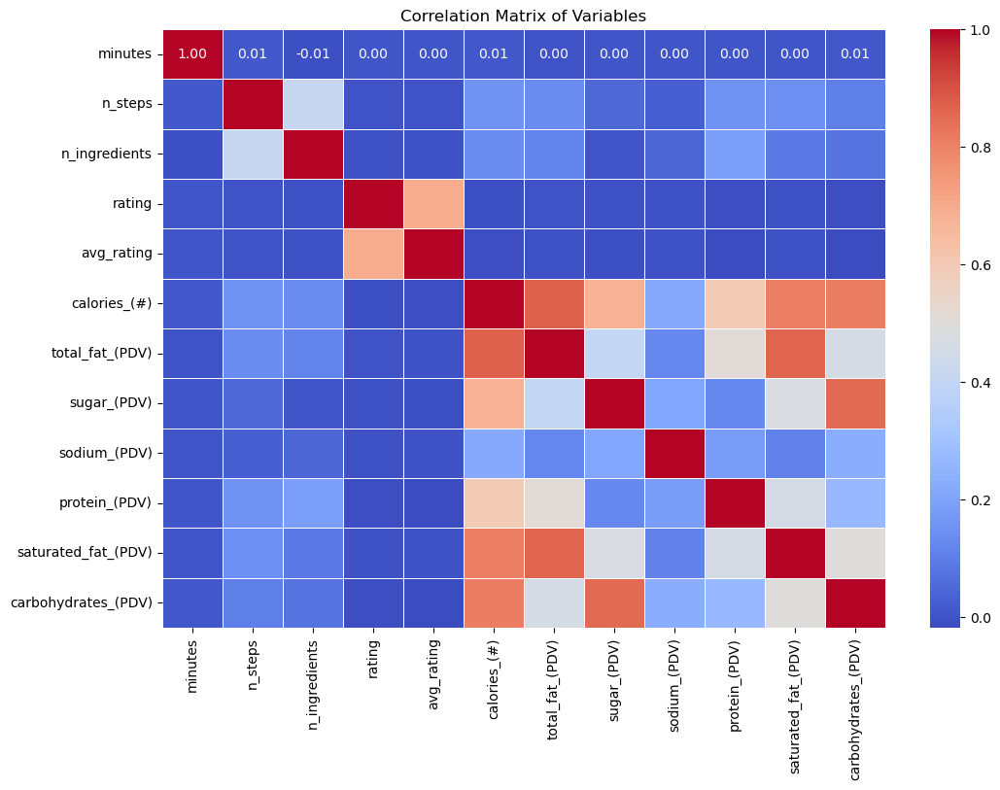

In [83]:
# Drop non-numeric columns
total_df_numeric = total_df.drop(columns=['tags', 'review'])

# Check if any column still needs conversion or handling
print(total_df_numeric.dtypes)

# Compute the correlation matrix
correlation_matrix = total_df_numeric.corr()

# Visualize the correlation matrix
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Variables')
plt.show()





### Regression Analysis

In [84]:
import statsmodels.api as sm

# Choose a dependent variable and independent variables
X = total_df_numeric[['n_steps', 'n_ingredients', 'calories_(#)', 'protein_(PDV)']]  # Independent variables
Y = total_df_numeric['avg_rating']  # Dependent variable

# Add a constant to the model (the intercept)
X = sm.add_constant(X)

# Create a model
model = sm.OLS(Y, X, missing='drop')  # 'drop' automatically drops all missing values

# Fit the model
results = model.fit()

# Print the summary of the regression
print(results.summary())


                            OLS Regression Results                            
Dep. Variable:             avg_rating   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     16.93
Date:                Wed, 05 Jun 2024   Prob (F-statistic):           6.86e-14
Time:                        23:41:23   Log-Likelihood:            -1.6706e+05
No. Observations:              231652   AIC:                         3.341e+05
Df Residuals:                  231647   BIC:                         3.342e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             4.6853      0.003   1692.921

### Exploring Non-linear Relationships

In [90]:
from sklearn.preprocessing import PolynomialFeatures

# Create polynomial features
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(total_df_numeric[['n_steps', 'n_ingredients']])

# Fit the model using polynomial features
model = sm.OLS(total_df_numeric['avg_rating'], sm.add_constant(X_poly))
results_poly = model.fit()

# Print the summary
print(results_poly.summary())



                            OLS Regression Results                            
Dep. Variable:             avg_rating   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 05 Jun 2024   Prob (F-statistic):                nan
Time:                        23:52:47   Log-Likelihood:                    nan
No. Observations:              234429   AIC:                               nan
Df Residuals:                  234423   BIC:                               nan
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const             nan        nan        nan        n

### Addressing Multicollinearity

In [91]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Assuming X is the set of independent variables
VIF_df = pd.DataFrame()
VIF_df["feature"] = X.columns
VIF_df["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(VIF_df)


         feature       VIF
0          const  7.156657
1        n_steps  1.215869
2  n_ingredients  1.224585
3   calories_(#)  1.553833
4  protein_(PDV)  1.574897


# Statistical Analysis of Recipe Data

## Data Preparation and Cleaning

In this initial phase, we loaded and merged two key datasets: recipes and user interactions. During the data cleaning process, we identified and transformed non-numeric columns such as `tags` and `reviews` to ensure our dataset was suitable for numerical analysis. Non-essential or list-based columns were either transformed (e.g., by calculating the length of lists) or excluded from our analyses to create a clean dataset, `total_df_numeric`, primed for further statistical exploration.

## Correlation Analysis

We computed a correlation matrix to explore the relationships between various numerical variables. These included:
- Cooking time (`minutes`)
- Number of steps (`n_steps`)
- Nutritional content (e.g., `calories`, `protein`)
- User ratings (`avg_rating`)

This step helped us understand how different variables interrelated and laid the groundwork for more complex analyses.

## Regression Analysis

Using linear regression, we examined how well certain variables could predict the average user ratings. We applied both simple and multiple regression models to assess the impact of individual predictors and combinations thereof on user ratings. This analysis provided quantitative insights into which factors most significantly influence user satisfaction.

## Regression Diagnostics

Post-regression, we conducted several diagnostic tests to validate the assumptions of our linear regression models:

- **Residuals vs. Fitted Plot**: We checked for homoscedasticity to ensure that the residuals had constant variance across fitted values.
- **Normal Q-Q Plot**: We assessed the normality of residuals.
- **Scale-Location Plot**: We further examined homoscedasticity.
- **Influence Plot**: We identified influential points that could potentially skew our model predictions.

These diagnostics were crucial for confirming the reliability and robustness of our regression findings.

## Exploring Non-linear Relationships and Multicollinearity

We explored potential non-linear relationships by incorporating polynomial terms in our regression models, allowing us to capture more complex interactions between variables. Additionally, we examined multicollinearity using the Variance Inflation Factor (VIF) to ensure that high intercorrelations among predictors did not adversely affect our regression results.

## Handling Outliers and Influential Points

To enhance the integrity of our models, we removed influential points identified via diagnostics like Cook's distance. This refinement was pivotal in ensuring that our models accurately represented the broader trends without being unduly influenced by outliers.

## Conclusion

Our comprehensive statistical analysis has provided profound insights into the factors influencing user ratings of recipes. By rigorously checking assumptions and refining our models, we have ensured that the insights we derived are well-supported by the data. This not only helps in understanding what drives user preferences but also guides recipe enhancements and content creation within the culinary community.
